In [1]:
import rasterio 
import os

In [2]:
path = os.getcwd()+'/cbers.tif'

In [3]:
raster_base = rasterio.open(path)

In [5]:
raster_base

<open DatasetReader name='C:/Users/eduar/Documents/python_gis3.11/.venv/Scripts/projeto/python_gis/cbers.tif' mode='r'>

In [6]:
raster_base.name

'C:/Users/eduar/Documents/python_gis3.11/.venv/Scripts/projeto/python_gis/cbers.tif'

In [13]:
raster_base.mode

'r'

In [14]:
raster_base.closed

False

In [16]:
raster_base.count

4

In [17]:
raster_base.width

1929

In [19]:
raster_base.height

1943

In [20]:
raster_base.crs

CRS.from_epsg(32721)

In [21]:
raster_base.indexes

(1, 2, 3, 4)

In [22]:
raster_base.dtypes

('float32', 'float32', 'float32', 'float32')

In [23]:
raster_base.bounds

BoundingBox(left=734856.0, bottom=7173612.0, right=750288.0, top=7189156.0)

In [24]:
raster_base.transform

Affine(8.0, 0.0, 734856.0,
       0.0, -8.0, 7189156.0)

In [27]:
raster_base.transform*(raster_base.width, raster_base.height)

(750288.0, 7173612.0)

In [28]:
raster_base.transform*(2,1)

(734872.0, 7189148.0)

In [15]:
band1 = raster_base.read(1)
band2 = raster_base.read(2)
band3 = raster_base.read(3)
band4 = raster_base.read(4)

In [16]:
band4/band1

C:\Users\eduar\AppData\Local\Temp\ipykernel_14900\1883429491.py:1: RuntimeWarning: divide by zero encountered in divide
  band4/band1


array([[1.798722 , 1.9833887, 2.3986487, ..., 1.5932835, 1.5535055,
        1.6074075],
       [1.4385542, 1.8808664, 2.0522647, ..., 1.5410448, 1.565543 ,
        1.6356877],
       [1.0711383, 1.5271566, 2.2562277, ..., 1.4157304, 1.4962963,
        1.5617977],
       ...,
       [2.0726073, 2.121212 , 1.9452055, ..., 2.0992646, 2.0408921,
        2.0588236],
       [2.2392027, 2.270903 , 2.2508473, ..., 2.0661764, 2.0892193,
        2.1360295],
       [2.2333333, 2.3400674, 2.2828283, ..., 2.1236362, 2.0592592,
        2.047619 ]], dtype=float32)

In [17]:
band1.shape

(1943, 1929)

In [18]:
  raster_base.close()

In [20]:
raster_base.closed

True

In [32]:
 with rasterio.open(path, 'r') as dst:
        band1 = dst.read(1)
        band2 = dst.read(2)
        band3 = dst.read(3)
        band4 = dst.read(4)

In [28]:
dst.closed

True

In [4]:
import rasterio
import os

path = os.getcwd() + '/cbers.tif'

with rasterio.open(path, 'r') as dst:
    band1 = dst.read(1)
    band2 = dst.read(2)
    band3 = dst.read(3)
    band4 = dst.read(4)
    profile = dst.profile

In [5]:
with rasterio.open('exported.tif', 'w',
                  driver='Gtiff',
                  dtype=rasterio.float32,
                  height = 1943,
                  width = 1929,
                  count = 1,
                  crs = '+proj=utm +zone=21 +south +datum=WGS84 +units=m +no_defs',
                   transform = (8.0, 0.0, 734856.0, 0.0, -8.0, 7189156.0)
                  ) as dst:
    dst.write(band1,1)
    

In [20]:
profile['count']=1
print(profile)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 1929, 'height': 1943, 'count': 1, 'crs': CRS.from_epsg(32721), 'transform': Affine(8.0, 0.0, 734856.0,
       0.0, -8.0, 7189156.0), 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


In [23]:
with rasterio.open('exported1','w',**profile) as dst:
    dst.write(band1,1)

In [5]:
import matplotlib.pyplot as plt
from rasterio.plot import show

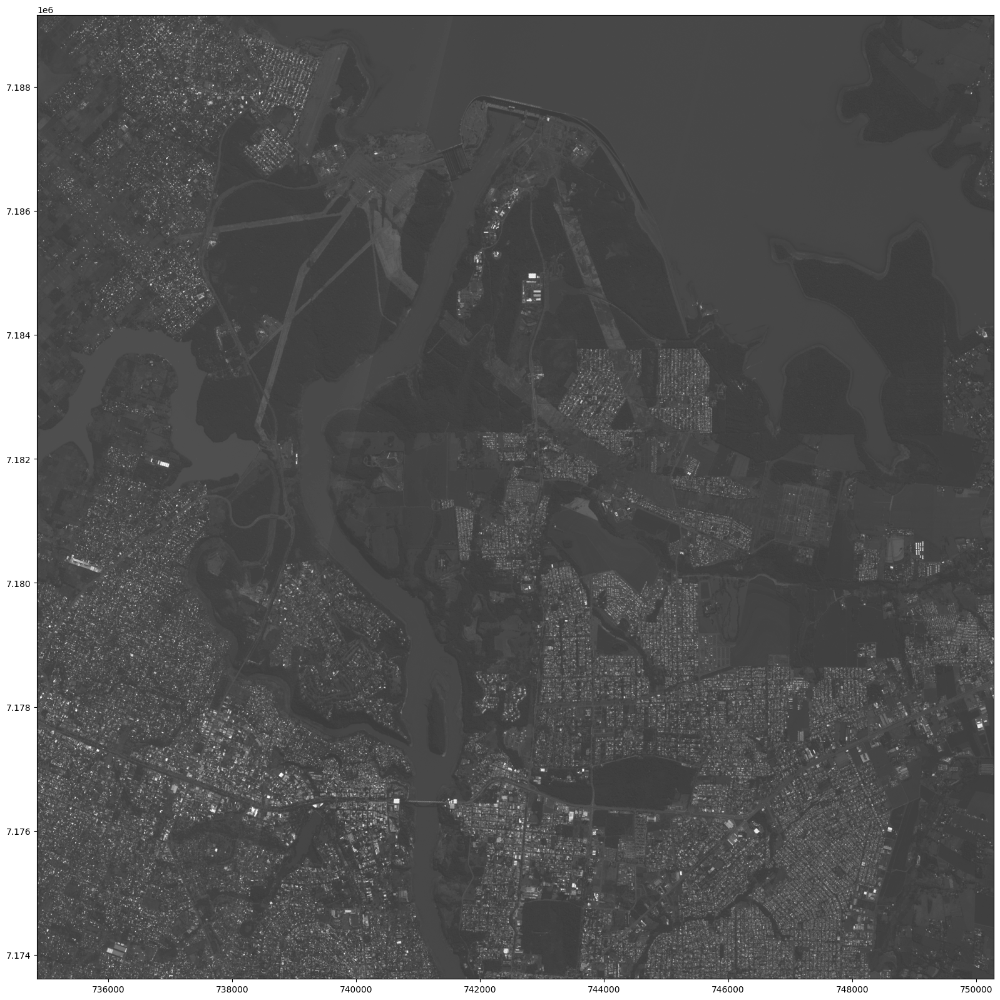

<Axes: >

In [30]:
plt.figure(figsize=(20,20))
show(band1, cmap='gray', transform=profile['transform'])

<Axes: title={'center': 'Banda 03'}>

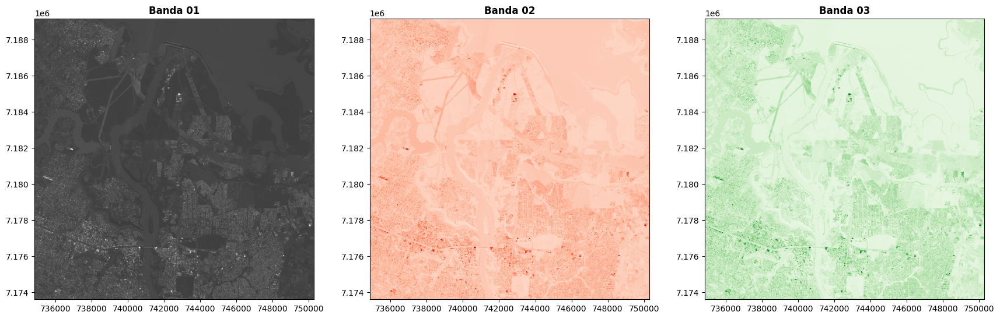

In [44]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(21, 7))
show(band1,ax=ax1, cmap='gray', transform=profile['transform'], title='Banda 01')
show(band2,ax=ax2, cmap='Reds', transform=profile['transform'], title='Banda 02')
show(band3,ax=ax3, cmap='Greens', transform=profile['transform'], title='Banda 03')

In [46]:
result = band1*band2

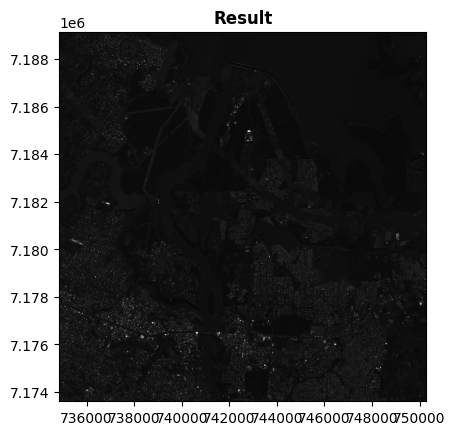

<Axes: title={'center': 'Result'}>

In [48]:
show(result, cmap='gray', transform=profile['transform'], title='Result')

In [49]:
import numpy as np

In [50]:
# Normalize bands into 0.0 - 1.0 scale
def normalize(array):
    array_min, array_max = array.min(), array.max()
    return (array - array_min) / (array_max - array_min)

In [52]:
normalize(band1)

array([[0.30596286, 0.29423264, 0.28934506, ..., 0.26197457, 0.26490712,
        0.2639296 ],
       [0.4056696 , 0.27077225, 0.2805474 , ..., 0.26197457, 0.26099706,
        0.2629521 ],
       [0.4809384 , 0.30596286, 0.2746823 , ..., 0.26099706, 0.2639296 ,
        0.26099706],
       ...,
       [0.29618767, 0.29032257, 0.285435  , ..., 0.26588467, 0.2629521 ,
        0.26588467],
       [0.29423264, 0.2922776 , 0.28836754, ..., 0.26588467, 0.2629521 ,
        0.26588467],
       [0.29325512, 0.29032257, 0.29032257, ..., 0.26881722, 0.2639296 ,
        0.26686218]], dtype=float32)

In [53]:
nir = normalize(band4)
r = normalize(band3)
g = normalize(band2)
b = normalize(band1)

In [54]:
rgb = np.dstack((r, g, b))

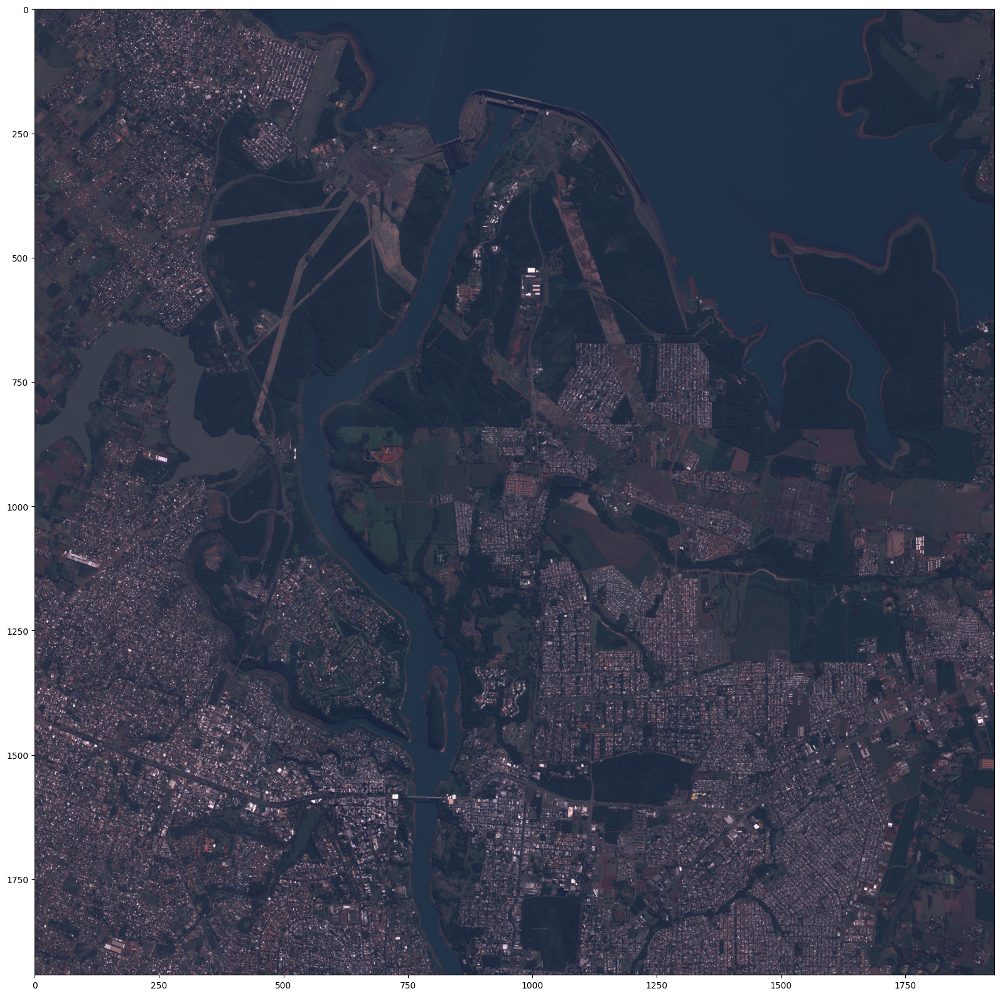

In [57]:
plt.figure(figsize=(20,20))
plt.imshow(rgb)

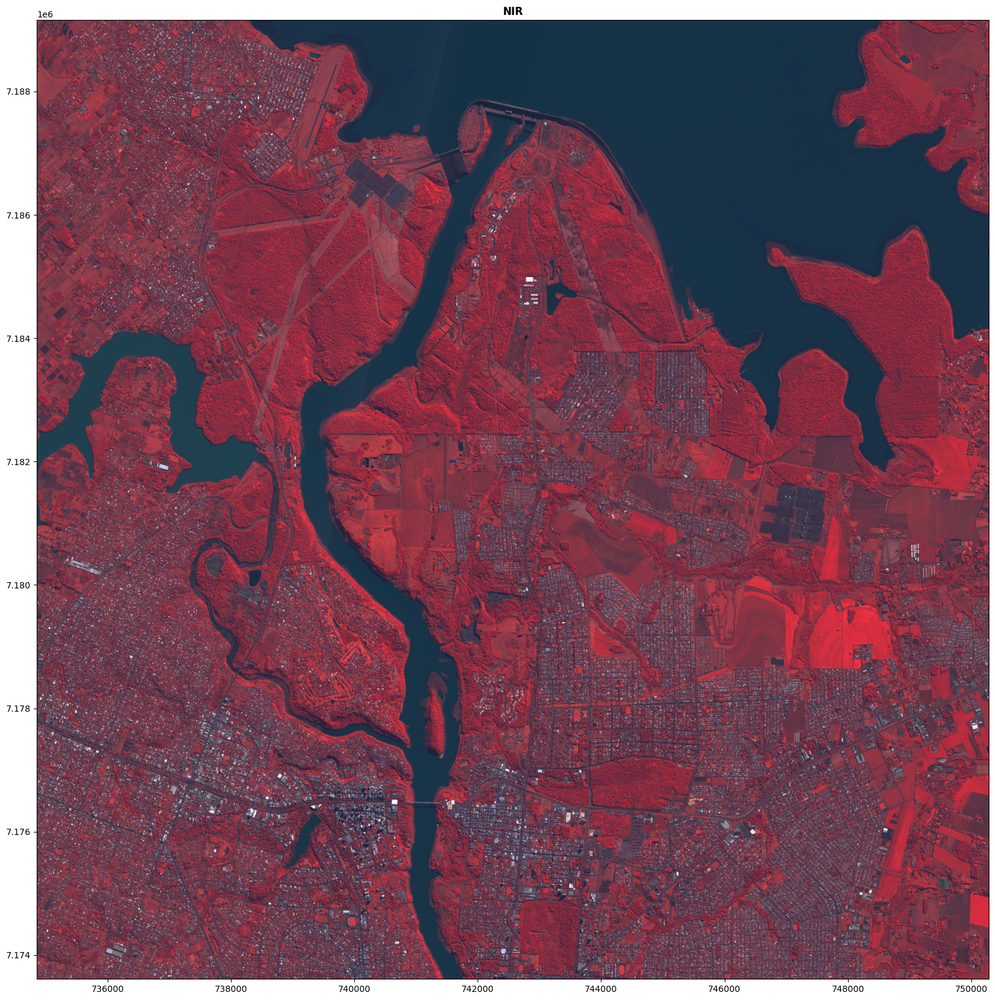

<Axes: title={'center': 'NIR'}>

In [61]:
plt.figure(figsize=(20,20))
show([nir, g, b], transform=profile['transform'], title='NIR')